In [0]:
import tensorflow as tf

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random 

In [0]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

In [22]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, None, None, 3 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, None, None, 3 96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, None, None, 3 0           batch_normalization_94[0][0]     
_______________________________________________________________________________________

In [0]:
# names = ['mixed8', 'mixed9']

# names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']
names = ['mixed3', 'mixed5']
# names = ['mixed5']

layers = [base_model.get_layer(name).output for name in names]

# Create the feature extraction model
deepdream_model = tf.keras.Model(inputs=base_model.input, outputs=layers)

In [24]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/original.jpg', target_size = (225, 375))

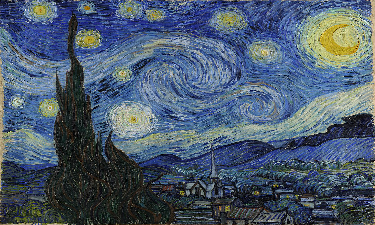

In [26]:
Sample_Image

In [27]:
np.shape(Sample_Image)

(225, 375, 3)

In [28]:
Sample_Image = np.array(Sample_Image)/255.0
Sample_Image.shape

(225, 375, 3)

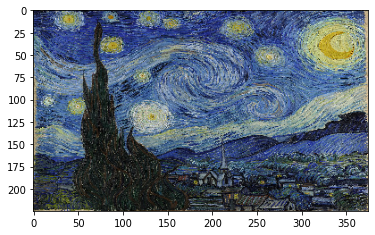

In [29]:
plt.imshow(Sample_Image)

In [30]:
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image.shape

(225, 375, 3)

In [0]:
 Sample_Image = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(Sample_Image))


In [32]:
 Sample_Image = tf.expand_dims(Sample_Image, axis = 0)
np.shape(Sample_Image)

TensorShape([1, 225, 375, 3])

In [33]:
activations = deepdream_model(Sample_Image)
activations

[<tf.Tensor: shape=(1, 12, 21, 768), dtype=float32, numpy=
 array([[[[0.        , 0.6254999 , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.6352263 , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.02112871, 0.        , ..., 0.        ,
           0.        , 0.        ],
          ...,
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ]],
 
         [[0.        , 0.00612552, 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.13483857, 0.        , ..., 0.        ,
           0.        , 0.        ],
          [0.        , 0.        , 0.        , ..., 0.        ,
           0.        , 0.        ],
          ...,
        

In [34]:
len(activations)

2

In [0]:
def calc_loss(image, model):
# Function used for loss calculations
# It works by feedforwarding the input image through the network and generate activations
# Then obtain the average and sum of those outputs

  img_batch = tf.expand_dims(image, axis=0) # Convert into batch format
  layer_activations = model(img_batch) # Run the model
  #print('ACTIVATION VALUES (LAYER OUTPUT) =\n', layer_activations)
  # print('ACTIVATION SHAPE =\n', np.shape(layer_activations))

  losses = [] # accumulator to hold all the losses
  for act in layer_activations:
    loss = tf.math.reduce_mean(act) # calculate mean of each activation 
    losses.append(loss)
  
  print('LOSSES (FROM MULTIPLE ACTIVATION LAYERS) = ', losses)
  print('LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) = ', np.shape(losses))
  print('SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)= ', tf.reduce_sum(losses))

  return  tf.reduce_sum(losses) # Calculate sum 

In [39]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/original.jpg', target_size = (225, 375))
Sample_Image = np.array(Sample_Image)/255.0
Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image = tf.Variable(tf.keras.applications.inception_v3.preprocess_input(Sample_Image))

loss = calc_loss(Sample_Image, deepdream_model)

LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor: shape=(), dtype=float32, numpy=0.2634555>, <tf.Tensor: shape=(), dtype=float32, numpy=0.17727217>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  tf.Tensor(0.44072768, shape=(), dtype=float32)


In [0]:
@tf.function
def deepdream(model, image, step_size):
    with tf.GradientTape() as tape:
      # This needs gradients relative to `img`
      # `GradientTape` only watches `tf.Variable`s by default
      tape.watch(image)
      loss = calc_loss(image, model) # call the function that calculate the loss 

    # Calculate the gradient of the loss with respect to the pixels of the input image.
    # The syntax is as follows: dy_dx = g.gradient(y, x) 
    gradients = tape.gradient(loss, image)

    print('GRADIENTS =\n', gradients)
    print('GRADIENTS SHAPE =\n', np.shape(gradients))

    # tf.math.reduce_std computes the standard deviation of elements across dimensions of a tensor
    gradients /= tf.math.reduce_std(gradients)  

    # In gradient ascent, the "loss" is maximized so that the input image increasingly "excites" the layers.
    # You can update the image by directly adding the gradients (because they're the same shape!)
    image = image + gradients * step_size
    image = tf.clip_by_value(image, -1, 1)

    return loss, image

In [0]:
def run_deep_dream_simple(model, image, steps=100, step_size=0.01):
  # Convert from uint8 to the range expected by the model.
  image = tf.keras.applications.inception_v3.preprocess_input(image)

  for step in range(steps):
    loss, image = deepdream(model, image, step_size)
    
    if step % 100 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(deprocess(image))
      plt.show()
      print ("Step {}, loss {}".format(step, loss))

  # clear_output(wait=True)
  plt.figure(figsize=(12,12))
  plt.imshow(deprocess(image))
  plt.show()

  return deprocess(image)

In [0]:
def deprocess(image):
  image = 255*(image + 1.0)/2.0
  return tf.cast(image, tf.uint8)

LOSSES (FROM MULTIPLE ACTIVATION LAYERS) =  [<tf.Tensor 'Mean:0' shape=() dtype=float32>, <tf.Tensor 'Mean_1:0' shape=() dtype=float32>]
LOSSES SHAPE (FROM MULTIPLE ACTIVATION LAYERS) =  (2,)
SUM OF ALL LOSSES (FROM ALL SELECTED LAYERS)=  Tensor("Sum:0", shape=(), dtype=float32)
GRADIENTS =
 Tensor("gradient_tape/Reshape_3:0", shape=(225, 375, 3), dtype=float32)
GRADIENTS SHAPE =
 (225, 375, 3)


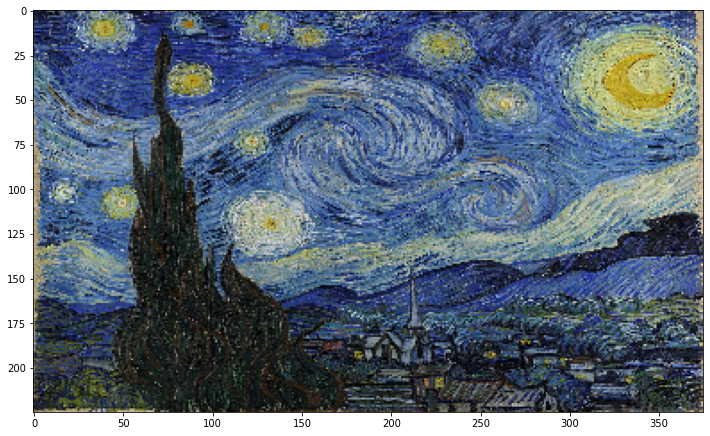

Step 0, loss 0.6168044805526733


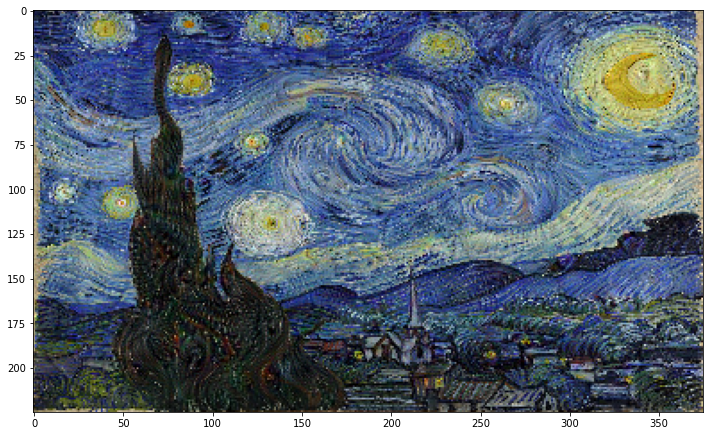

Step 100, loss 1.4086527824401855


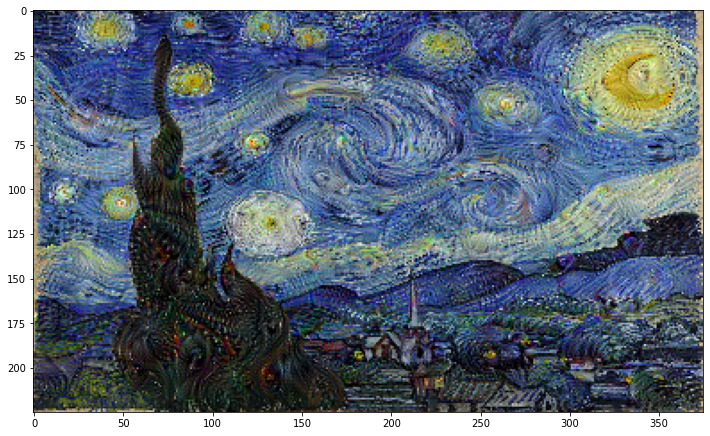

Step 200, loss 1.719984769821167


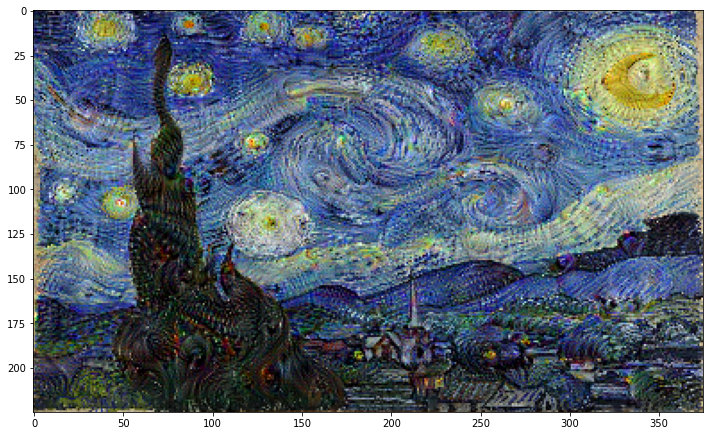

Step 300, loss 1.9098691940307617


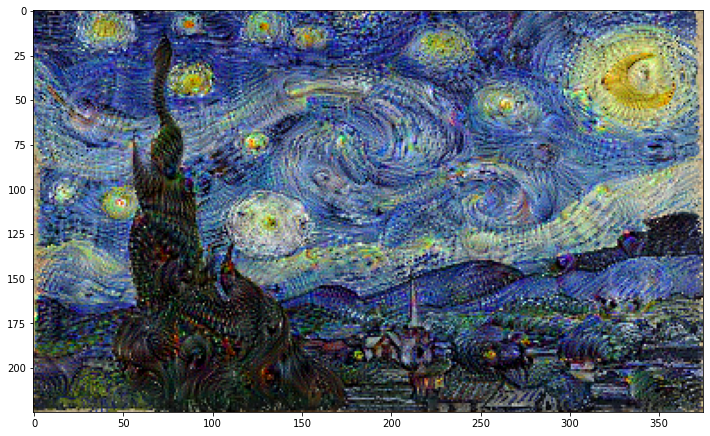

Step 400, loss 2.049469470977783


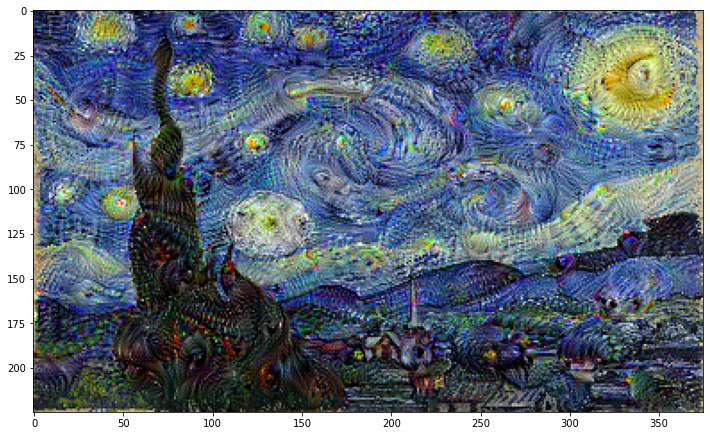

Step 500, loss 2.161714792251587


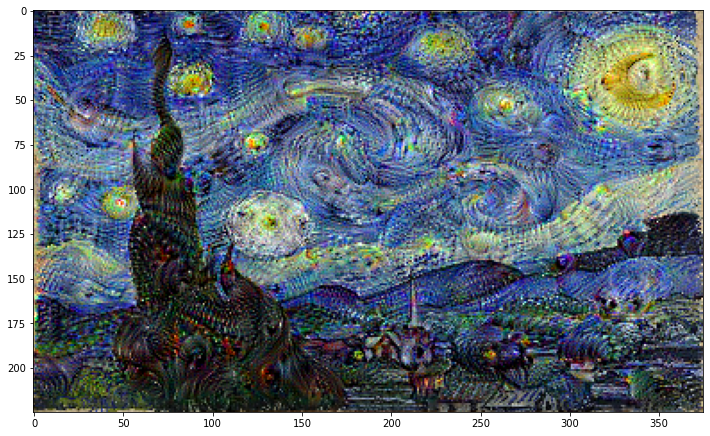

Step 600, loss 2.2510011196136475


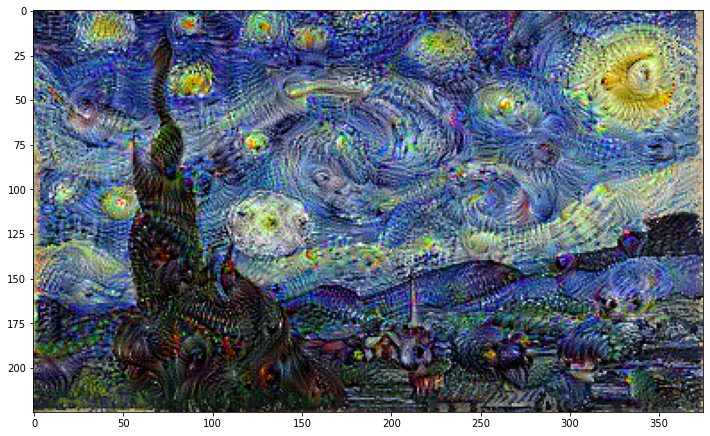

Step 700, loss 2.328578472137451


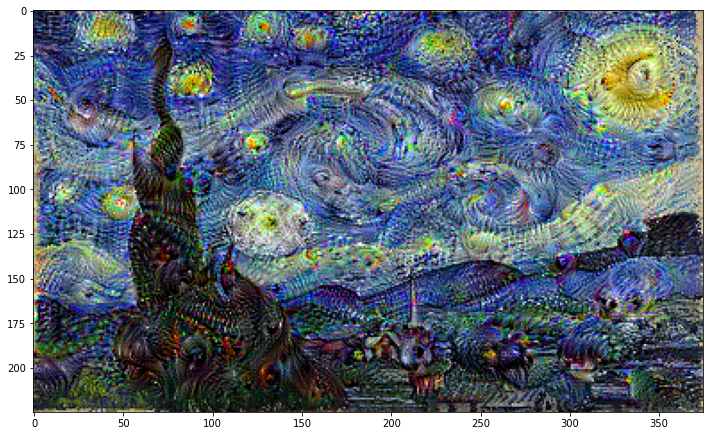

Step 800, loss 2.3991200923919678


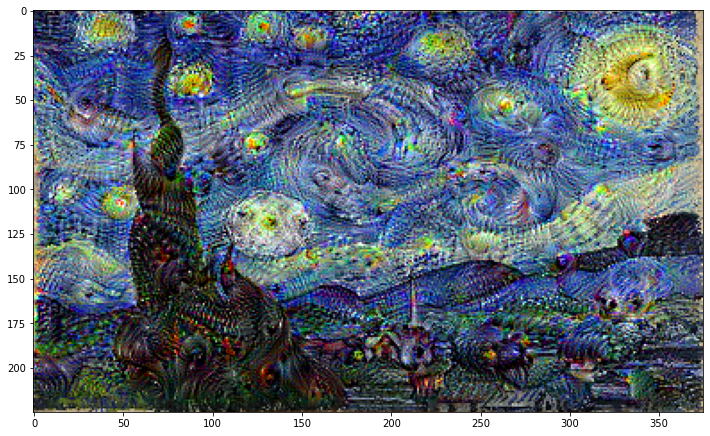

Step 900, loss 2.4627695083618164


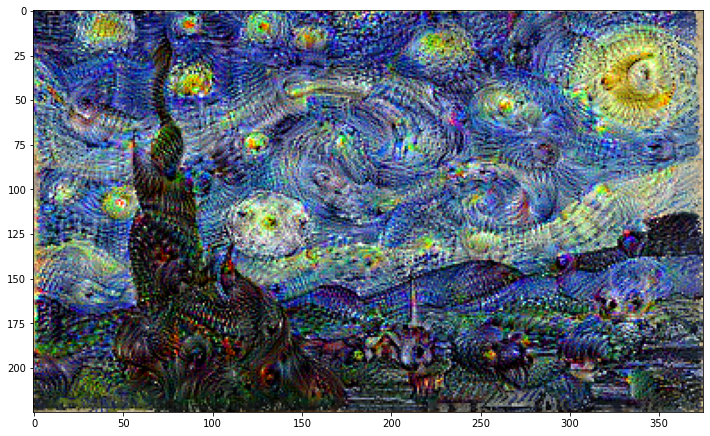

Step 1000, loss 2.5220742225646973


In [0]:
Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/original.jpg', target_size = (225, 375))
# Sample_Image= tf.keras.preprocessing.image.load_img(r'/content/drive/My Drive/Colab Notebooks/StaryNight.jpg', target_size = (225, 375))

# Sample_Image = np.array(Sample_Image)/255.0
# Sample_Image = tf.keras.preprocessing.image.img_to_array(Sample_Image)
Sample_Image = np.array(Sample_Image)
# Sample_Image = tf.keras.applications.inception_v3.preprocess_input(Sample_Image)
dream_img = run_deep_dream_simple(model=deepdream_model, image=Sample_Image, 
                                  steps=2000, step_size=0.001)